<a href="https://colab.research.google.com/github/stahelin/puc_dl2cv/blob/main/tau.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1 - Instalando todas as dependencias do OpenSTL (Mesmo que redundantes, por garantia) e montando o Drive
*Reinicie o ambiente de execução antes de prosseguir para utilizar as versões mais recentes instaladas


In [ ]:
!git clone https://github.com/chengtan9907/OpenSTL

In [ ]:
import os
!pip install fvcore
!pip install -e OpenSTL
os.chdir('/content/OpenSTL')

In [ ]:
!pip install argparse
!pip install dask
!pip install decord
!pip install git+https://github.com/facebookresearch/fvcore.git
!pip install hickle
!pip install lpips
!pip install matplotlib
!pip install netCDF4
!pip install numpy
!pip install opencv-python
!pip install packaging
!pip install pandas
!pip install scikit-image
!pip install scikit-learn
!pip install torch
!pip install timm
!pip install tqdm
!pip install xarray==0.19.0

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


#2 - Carregando bibliotecas

In [ ]:
import pickle
import cv2
import numpy as np
import os
import numpy as np
import torch
from torch.utils.data import Dataset
from openstl.utils import show_video_line
from openstl.api import BaseExperiment
from openstl.utils import create_parser, default_parser

#3 - Pré-processamento dos vídeos (redimensionamento, armazenamento dos frames em pkl)

In [ ]:
batch_size = 1
pre_seq_length = 10
aft_seq_length = 20

def sample_frames(video_path, num_frames=20):
    height = 224
    width = 224
    # Lê o vídeo
    video = cv2.VideoCapture(video_path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    # Amostra uniformemente quadros do vídeo
    frame_idxs = np.linspace(0, total_frames-1, num_frames, dtype=int)
    frames = []
    for idx in frame_idxs:
        video.set(cv2.CAP_PROP_POS_FRAMES, idx)
        _, frame = video.read()
        frame = cv2.resize(frame, (height, width))
        frames.append(frame)
    video.release()
    return np.stack(frames)

def process_folder(folder_path, pre_slen=10, aft_slen=10, suffix='.avi'):
    # Obtém todos os vídeos nesta pasta
    videos = []
    files = os.listdir(folder_path)
    for file in files:
        video_path = os.path.join(folder_path, file)
        if os.path.isfile(video_path) and file.endswith(suffix):
            video = sample_frames(video_path, pre_slen + aft_slen)
            videos.append(video)
    # Empilha quadros de vídeo de cada pasta
    data = np.stack(videos).transpose(0, 1, 4, 2, 3)

    # se os dados estão em [0, 255], reescala para [0, 1]
    if data.max() > 1.0:
        data = data.astype(np.float32) / 255.0

    return data[:, :pre_slen], data[:, pre_slen:]

# Caminho base para as pastas de dados no Google Drive
base_path = '/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/video_dataset'

dataset = {}
folders = ['train', 'val', 'test']
for folder in folders:
    folder_path = os.path.join(base_path, folder)  # Caminho atualizado
    data_x, data_y = process_folder(folder_path, pre_slen=pre_seq_length, aft_slen=aft_seq_length, suffix='.avi')
    dataset['X_' + folder], dataset['Y_' + folder] = data_x, data_y

# Salva como um arquivo pkl
with open('/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/dataset_224.pkl', 'wb') as f:
    pickle.dump(dataset, f)

## Carregando dados

with open('/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/dataset_224.pkl', 'rb') as f:
    dataset = pickle.load(f)

train_x, train_y = dataset['X_train'], dataset['Y_train']
print(train_x.shape)



(7, 10, 3, 224, 224)


#4 - TAU - Configurações de treinamento

In [57]:
custom_training_config = {
    'pre_seq_length': pre_seq_length,
    'aft_seq_length': aft_seq_length,
    'total_length': pre_seq_length + aft_seq_length,
    'batch_size': batch_size,
    'val_batch_size': batch_size,
    'epoch': 50,
    'lr': 0.001,
    'metrics': ['mse', 'mae', "rmse"],

    'ex_name': 'tau',
    'dataname': 'custom',
    'in_shape': [10, 3, 224, 224],
}

custom_model_config = {
    'method': 'SimVP',
    'model_type': 'tau',
    'N_S': 4,
    'N_T': 8,
    'hid_S': 64,
    'hid_T': 256
}

custom_model_config = {
    'method': 'SimVP',
    'model_type': 'MogaNet',
    'N_S': 4,
    'N_T': 8,
    'hid_S': 64,
    'hid_T': 256
}

#5 - Dataloader

In [58]:
class CustomDataset(Dataset):
    def __init__(self, X, Y, normalize=False):
        super(CustomDataset, self).__init__()
        self.X = X
        self.Y = Y
        self.mean = None
        self.std = None

        if normalize:
            # get the mean/std values along the channel dimension
            mean = data.mean(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            std = data.std(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            data = (data - mean) / std
            self.mean = mean
            self.std = std

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, index):
        data = torch.tensor(self.X[index]).float()
        labels = torch.tensor(self.Y[index]).float()
        return data, labels


X_train, X_val, X_test, Y_train, Y_val, Y_test = dataset['X_train'], dataset[
    'X_val'], dataset['X_test'], dataset['Y_train'], dataset['Y_val'], dataset['Y_test']

train_set = CustomDataset(X=X_train, Y=Y_train)
val_set = CustomDataset(X=X_val, Y=Y_val)
test_set = CustomDataset(X=X_test, Y=Y_test)

dataloader_train = torch.utils.data.DataLoader(
    train_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_val = torch.utils.data.DataLoader(
    val_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_test = torch.utils.data.DataLoader(
    test_set, batch_size=batch_size, shuffle=True, pin_memory=True)

#6 - Configurações experimentais

In [59]:
args = create_parser().parse_args([])
config = args.__dict__

# Atualiza a configuração de treinamento
config.update(custom_training_config)
# Atualiza a configuração do modelo
config.update(custom_model_config)
# Preenche com valores padrão
default_values = default_parser()
for attribute in default_values.keys():
    if config[attribute] is None:
        config[attribute] = default_values[attribute]

exp = BaseExperiment(args, dataloaders=(dataloader_train, dataloader_val, dataloader_test))


Use non-distributed mode with GPU: cuda:0
Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
CUDA available: True
CUDA_HOME: /usr/local/cuda
NVCC: Build cuda_11.8.r11.8/compiler.31833905_0
GPU 0: NVIDIA A100-SXM4-40GB
GCC: gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
PyTorch: 2.1.0+cu118
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75

In [60]:
import contextlib
with open('training_output.txt', 'w') as f:
    with contextlib.redirect_stdout(f):
        exp.train()
        exp.test()


train loss: 0.0369 | data time: 0.0047: 100%|██████████| 7/7 [00:00<00:00,  8.85it/s]

[>>>>>>>                                           ] 1/7, 15.5 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:33] Intermediate result: 5289.059  (Index 250)


train loss: 0.0258 | data time: 0.0047: 100%|██████████| 7/7 [00:00<00:00,  9.06it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:35] Intermediate result: 3547.316  (Index 251)


train loss: 0.0174 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.95it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:37] Intermediate result: 2290.9346  (Index 252)


train loss: 0.0071 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  8.97it/s]

[>>>>>>>                                           ] 1/7, 15.0 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:39] Intermediate result: 1047.5153  (Index 253)


train loss: 0.0065 | data time: 0.0052: 100%|██████████| 7/7 [00:00<00:00,  8.87it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:41] Intermediate result: 884.30914  (Index 254)


train loss: 0.0042 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.74it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:45] Intermediate result: 593.5033  (Index 255)


train loss: 0.0032 | data time: 0.0049: 100%|██████████| 7/7 [00:00<00:00,  8.98it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:47] Intermediate result: 462.30786  (Index 256)


train loss: 0.0025 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  9.01it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:49] Intermediate result: 397.56857  (Index 257)


train loss: 0.0023 | data time: 0.0051: 100%|██████████| 7/7 [00:00<00:00,  9.02it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:51] Intermediate result: 342.53458  (Index 258)


train loss: 0.0019 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.97it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:53] Intermediate result: 306.2143  (Index 259)


train loss: 0.0019 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  8.73it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:57] Intermediate result: 273.83356  (Index 260)


train loss: 0.0016 | data time: 0.0052: 100%|██████████| 7/7 [00:00<00:00,  8.98it/s]

[>>>>>>>                                           ] 1/7, 15.1 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:47:59] Intermediate result: 250.51805  (Index 261)


train loss: 0.0016 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  8.77it/s]

[>>>>>>>                                           ] 1/7, 15.5 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:02] Intermediate result: 234.34566  (Index 262)


train loss: 0.0015 | data time: 0.0049: 100%|██████████| 7/7 [00:00<00:00,  9.04it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:04] Intermediate result: 220.93846  (Index 263)


train loss: 0.0041 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  8.78it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:07] Intermediate result: 200.7819  (Index 264)


train loss: 0.0013 | data time: 0.0047: 100%|██████████| 7/7 [00:00<00:00,  8.97it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:09] Intermediate result: 195.85172  (Index 265)


train loss: 0.0012 | data time: 0.0052: 100%|██████████| 7/7 [00:00<00:00,  9.01it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:11] Intermediate result: 179.75996  (Index 266)


train loss: 0.0010 | data time: 0.0052: 100%|██████████| 7/7 [00:00<00:00,  8.72it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:15] Intermediate result: 181.55348  (Index 267)


train loss: 0.0009 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00,  9.06it/s]

[>>>>>>>                                           ] 1/7, 15.6 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:17] Intermediate result: 162.90068  (Index 268)


train loss: 0.0024 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  9.03it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.7 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:19] Intermediate result: 181.72778  (Index 269)


train loss: 0.0012 | data time: 0.0053: 100%|██████████| 7/7 [00:00<00:00,  8.94it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:21] Intermediate result: 158.61128  (Index 270)


train loss: 0.0010 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00,  9.09it/s]

[>>>>>>>                                           ] 1/7, 15.6 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:22] Intermediate result: 152.31998  (Index 271)


train loss: 0.0023 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.85it/s]

[>>>>>>>                                           ] 1/7, 15.1 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:26] Intermediate result: 148.57242  (Index 272)


train loss: 0.0011 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.92it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:27] Intermediate result: 140.91342  (Index 273)


train loss: 0.0008 | data time: 0.0055: 100%|██████████| 7/7 [00:00<00:00,  8.80it/s]

[>>>>>>>                                           ] 1/7, 15.0 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:31] Intermediate result: 132.91212  (Index 274)


train loss: 0.0040 | data time: 0.0051: 100%|██████████| 7/7 [00:00<00:00,  8.86it/s]

[>>>>>>>                                           ] 1/7, 15.1 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:33] Intermediate result: 132.70267  (Index 275)


train loss: 0.0040 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  8.70it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:36] Intermediate result: 130.44272  (Index 276)


train loss: 0.0022 | data time: 0.0049: 100%|██████████| 7/7 [00:00<00:00,  8.95it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:38] Intermediate result: 130.04962  (Index 277)


train loss: 0.0007 | data time: 0.0049: 100%|██████████| 7/7 [00:00<00:00,  8.70it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:41] Intermediate result: 120.883804  (Index 278)


train loss: 0.0040 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.96it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:44] Intermediate result: 123.63263  (Index 279)


train loss: 0.0006 | data time: 0.0047: 100%|██████████| 7/7 [00:00<00:00,  9.00it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:46] Intermediate result: 115.85418  (Index 280)


train loss: 0.0007 | data time: 0.0043: 100%|██████████| 7/7 [00:00<00:00,  9.06it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.2 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:48] Intermediate result: 117.6888  (Index 281)


train loss: 0.0039 | data time: 0.0055: 100%|██████████| 7/7 [00:00<00:00,  8.79it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:49] Intermediate result: 111.951836  (Index 282)


train loss: 0.0006 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.86it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:53] Intermediate result: 113.08308  (Index 283)


train loss: 0.0007 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  9.02it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:54] Intermediate result: 110.10232  (Index 284)


train loss: 0.0006 | data time: 0.0046: 100%|██████████| 7/7 [00:00<00:00,  8.86it/s]

[>>>>>>>                                           ] 1/7, 15.2 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:57] Intermediate result: 110.25628  (Index 285)


train loss: 0.0020 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00,  9.06it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:48:59] Intermediate result: 109.27464  (Index 286)


train loss: 0.0038 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.81it/s]

[>>>>>>>                                           ] 1/7, 15.5 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:02] Intermediate result: 106.78243  (Index 287)


train loss: 0.0007 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  9.01it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:04] Intermediate result: 108.99114  (Index 288)


train loss: 0.0006 | data time: 0.0049: 100%|██████████| 7/7 [00:00<00:00,  9.05it/s]

[>>>>>>>                                           ] 1/7, 15.5 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:07] Intermediate result: 109.19725  (Index 289)


train loss: 0.0006 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00,  9.06it/s]

[>>>>>>>                                           ] 1/7, 15.6 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:09] Intermediate result: 109.641335  (Index 290)


train loss: 0.0037 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00,  9.06it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:11] Intermediate result: 106.78805  (Index 291)


train loss: 0.0007 | data time: 0.0045: 100%|██████████| 7/7 [00:00<00:00,  9.05it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:13] Intermediate result: 106.84386  (Index 292)


train loss: 0.0005 | data time: 0.0052: 100%|██████████| 7/7 [00:00<00:00,  9.01it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.3 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:14] Intermediate result: 107.04366  (Index 293)


train loss: 0.0006 | data time: 0.0053: 100%|██████████| 7/7 [00:00<00:00,  9.01it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.6 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:16] Intermediate result: 107.56324  (Index 294)


train loss: 0.0005 | data time: 0.0055: 100%|██████████| 7/7 [00:00<00:00,  8.93it/s]

[>>>>>>>                                           ] 1/7, 15.7 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:18] Intermediate result: 107.19493  (Index 295)


train loss: 0.0018 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  9.05it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:20] Intermediate result: 106.84863  (Index 296)


train loss: 0.0008 | data time: 0.0051: 100%|██████████| 7/7 [00:00<00:00,  8.80it/s]

[>>>>>>>                                           ] 1/7, 15.4 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.4 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:23] Intermediate result: 106.78868  (Index 297)


train loss: 0.0005 | data time: 0.0048: 100%|██████████| 7/7 [00:00<00:00,  8.99it/s]

[>>>>>>>                                           ] 1/7, 15.1 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:25] Intermediate result: 106.7361  (Index 298)


train loss: 0.0018 | data time: 0.0050: 100%|██████████| 7/7 [00:00<00:00,  8.96it/s]

[>>>>>>>                                           ] 1/7, 15.3 task/s, elapsed: 0s, ETA:     0s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 14.5 task/s, elapsed: 0s, ETA:     0s[2023-12-12 20:49:27] Intermediate result: 106.74184  (Index 299)
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 7/7, 19.1 task/s, elapsed: 0s, ETA:     0s

#7 - Resultados

In [61]:
import re

def process_log_file(filename):
    with open(filename, 'r') as file:
        lines = file.readlines()

    train_losses = []
    val_losses = []
    val_mse = []
    val_mae = []

    for line in lines:
        # Encontrar e armazenar a perda de treinamento
        train_match = re.search(r'Train Loss: ([0-9\.]+)', line)
        if train_match:
            train_losses.append(float(train_match.group(1)))

        # Encontrar e armazenar a perda de validação
        val_match = re.search(r'Vali Loss: ([0-9\.]+)', line)
        if val_match:
            val_losses.append(float(val_match.group(1)))

        # Exemplo para capturar MSE e MAE da validação
        mse_match = re.search(r'mse:([0-9\.]+)', line)
        if mse_match:
            val_mse.append(float(mse_match.group(1)))

        mae_match = re.search(r'mae:([0-9\.]+)', line)
        if mae_match:
            val_mae.append(float(mae_match.group(1)))

    return train_losses, val_losses, val_mse, val_mae

train_losses, val_losses, val_mse, val_mae = process_log_file('training_output.txt')


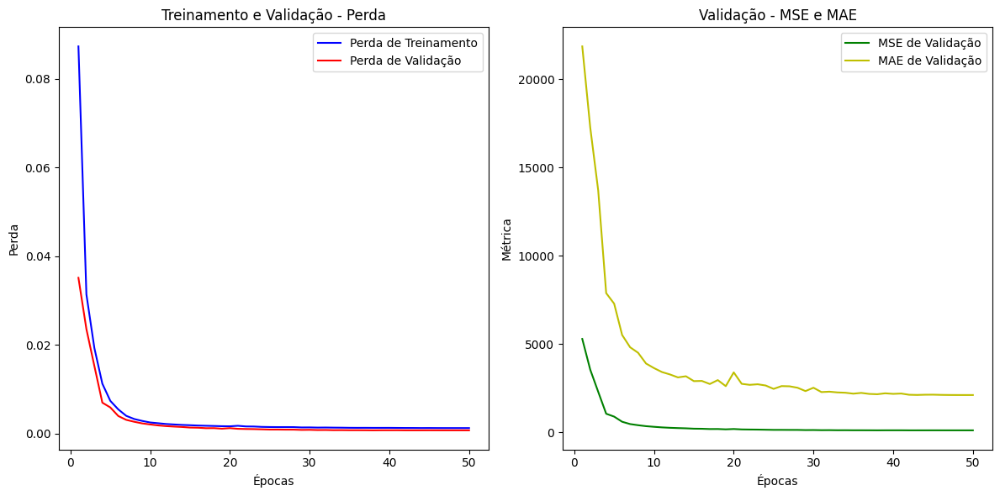

In [62]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses) + 1)


# Ajustar o tamanho das listas para corresponder
min_length = min(len(epochs), len(val_mse), len(val_mae))
epochs = epochs[:min_length]
val_mse = val_mse[:min_length]
val_mae = val_mae[:min_length]

# Agora, plotar os gráficos
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'b-', label='Perda de Treinamento')
plt.plot(epochs, val_losses, 'r-', label='Perda de Validação')
plt.title('Treinamento e Validação - Perda')
plt.xlabel('Épocas')
plt.ylabel('Perda')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, val_mse, 'g-', label='MSE de Validação')
plt.plot(epochs, val_mae, 'y-', label='MAE de Validação')
plt.title('Validação - MSE e MAE')
plt.xlabel('Épocas')
plt.ylabel('Métrica')
plt.legend()

plt.tight_layout()
plt.show()


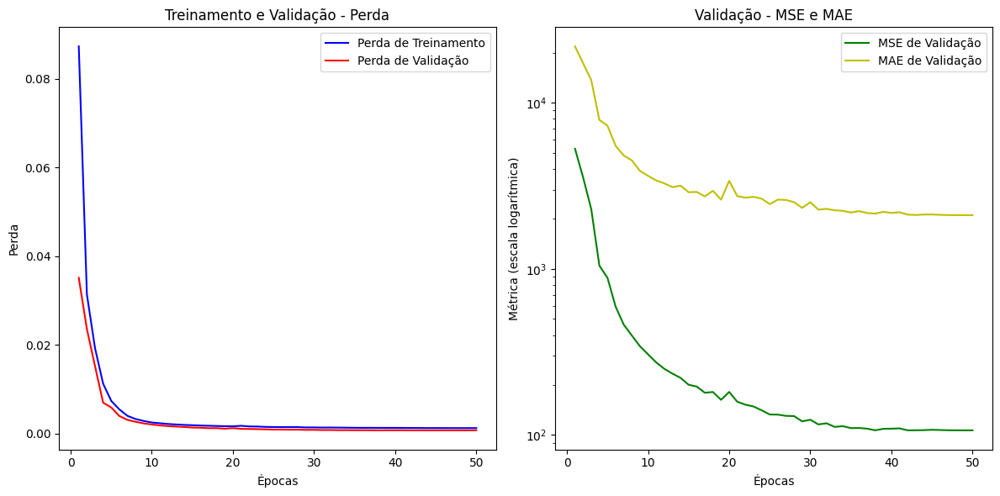

In [63]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses) + 1)

# Ajustar o tamanho das listas para corresponder
min_length = min(len(epochs), len(val_mse), len(val_mae))
epochs = epochs[:min_length]
val_mse = val_mse[:min_length]
val_mae = val_mae[:min_length]

# Agora, plotar os gráficos
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'b-', label='Perda de Treinamento')
plt.plot(epochs, val_losses, 'r-', label='Perda de Validação')
plt.title('Treinamento e Validação - Perda')
plt.xlabel('Épocas')
plt.ylabel('Perda')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, val_mse, 'g-', label='MSE de Validação')
plt.plot(epochs, val_mae, 'y-', label='MAE de Validação')
plt.title('Validação - MSE e MAE')
plt.xlabel('Épocas')
plt.ylabel('Métrica (escala logarítmica)')
plt.yscale('log')
plt.legend()

plt.tight_layout()
plt.show()


tau


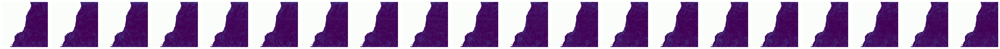

In [64]:
custom_exp = custom_training_config["ex_name"]
print(custom_exp)
inputs = np.load(f'./work_dirs/{custom_exp}/saved/inputs.npy')
preds = np.load(f'./work_dirs/{custom_exp}/saved/preds.npy')
trues = np.load(f'./work_dirs/{custom_exp}/saved/trues.npy')

example_idx = 0
show_video_line(trues[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

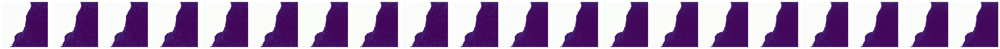

In [65]:
example_idx = 0
show_video_line(preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

/content/OpenSTL/openstl/utils/visualization.py:117: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(9, 6))


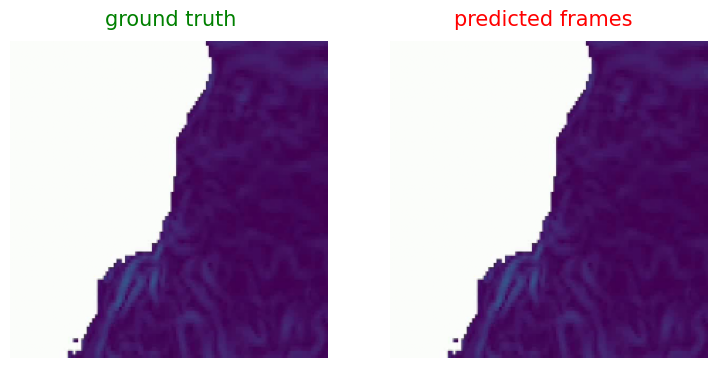

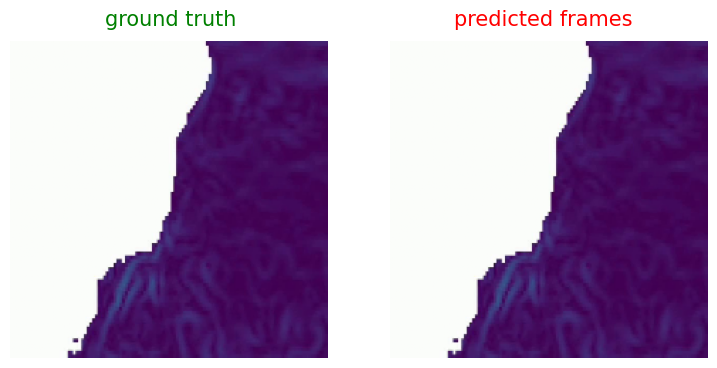

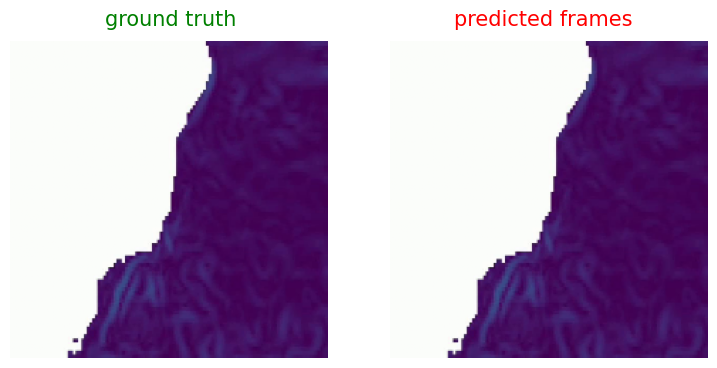

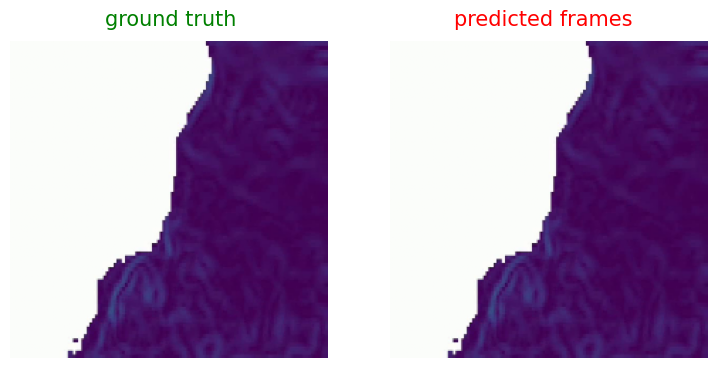

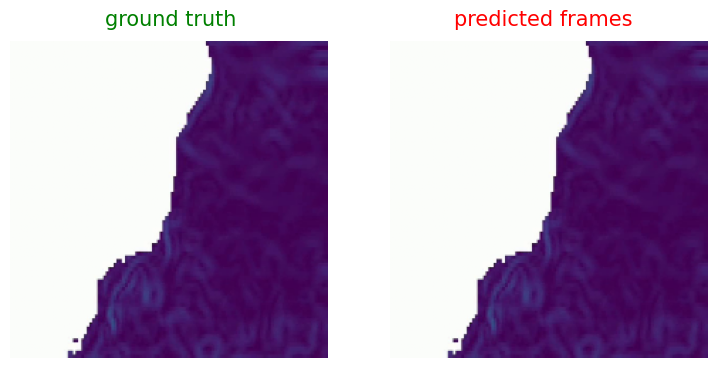

...

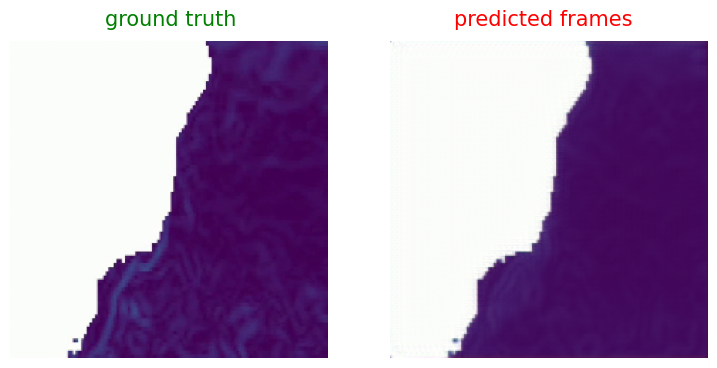

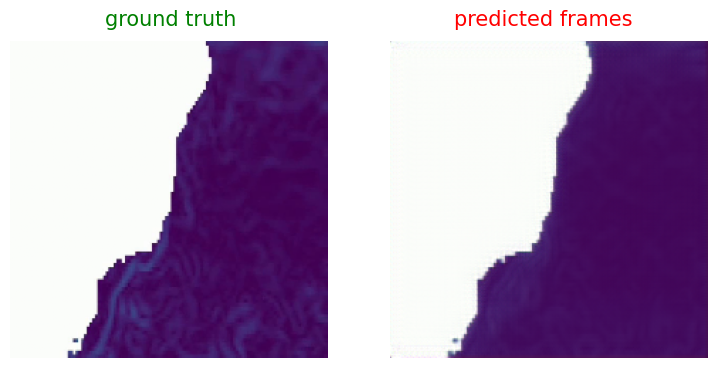

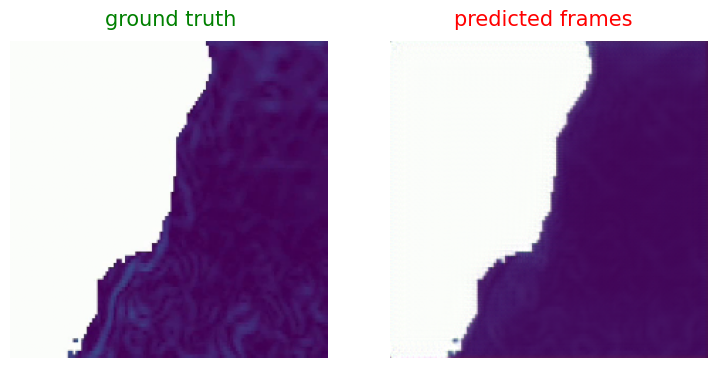

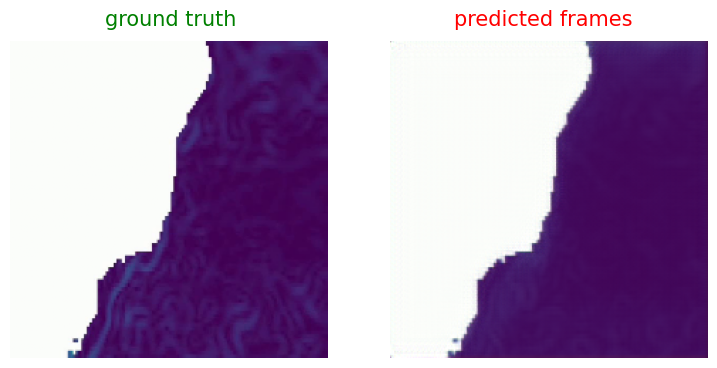

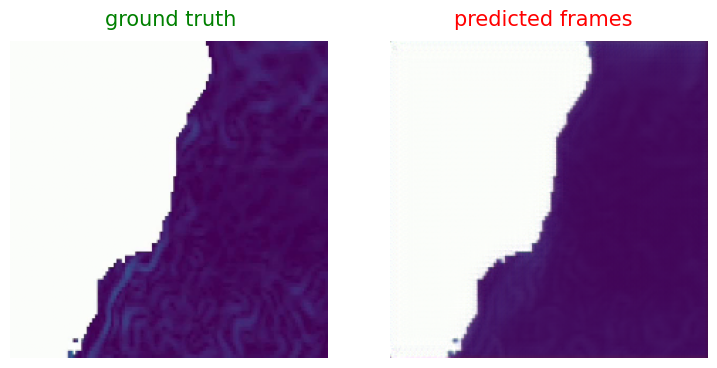

In [66]:
from openstl.utils import show_video_gif_multiple


# Diretório no Google Drive onde você quer salvar o arquivo
save_dir = '/content/drive/MyDrive/Doutorado/DL2CV/Trabalho/'

example_idx = 0
# Caminho completo incluindo o diretório no Google Drive
out_path = save_dir + f'{custom_exp}.gif'

show_video_gif_multiple(inputs[example_idx], trues[example_idx], preds[example_idx], use_rgb=True, out_path=out_path)

example_idx = 0
show_video_gif_multiple(inputs[example_idx], trues[example_idx], preds[example_idx], use_rgb=True, out_path=f'{custom_exp}.gif')